# VGG16

## Image Classification

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

TypeError: Descriptors cannot be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates

In [ ]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

In [ ]:
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/Users/woorethane/.keras/datasets/cats_and_dogs_filtered/train
/Users/woorethane/.keras/datasets/cats_and_dogs_filtered/validation


In [ ]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 
print(train_cats_dir)

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  
print(validation_dogs_dir)

/Users/woorethane/.keras/datasets/cats_and_dogs_filtered/train/cats
/Users/woorethane/.keras/datasets/cats_and_dogs_filtered/train/dogs
/Users/woorethane/.keras/datasets/cats_and_dogs_filtered/validation/cats
/Users/woorethane/.keras/datasets/cats_and_dogs_filtered/validation/dogs


In [ ]:
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


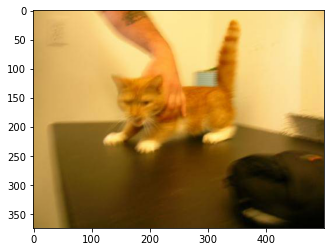

In [ ]:
from PIL import Image

image_path = os.path.join(train_dir, 'cats')
image = Image.open(image_path + '/cat.0.jpg')

plt.imshow(image)
plt.show()

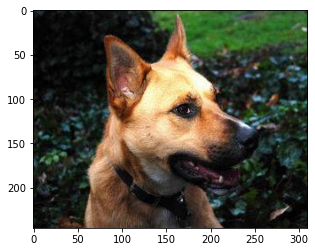

In [ ]:
image_path = os.path.join(train_dir, 'dogs')
image = Image.open(image_path + '/dog.251.jpg')


plt.imshow(image)
plt.show()

In [ ]:
# parameter Initialization
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True, 
                                     vertical_flip=False)

In [2]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

NameError: name 'image_gen_train' is not defined

In [12]:
train_data_gen[0][0].shape

(16, 256, 256, 3)

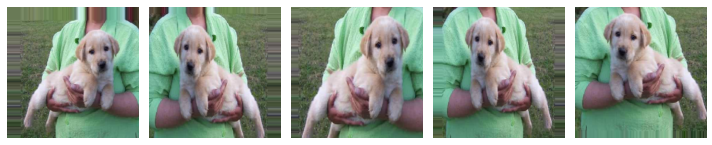

In [13]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [14]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [15]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


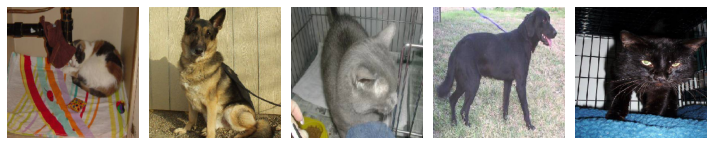

In [16]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [17]:
_[:5] # 정답 데이터

array([0., 1., 0., 1., 0.], dtype=float32)

## VGG16 모델 구현하기

In [18]:
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
# x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)



x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dense(1000, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 128)     147584    
                                                             

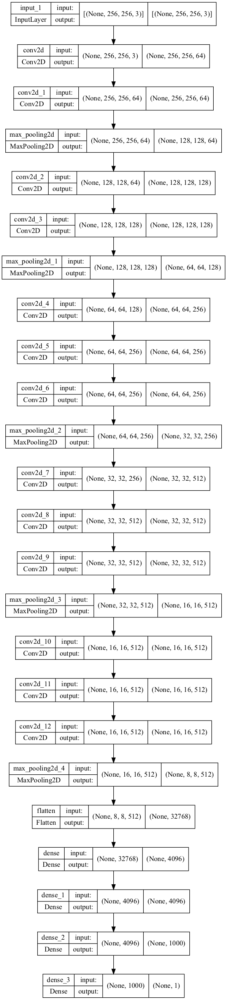

In [19]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True,)

In [20]:
# !pip install visualkeras

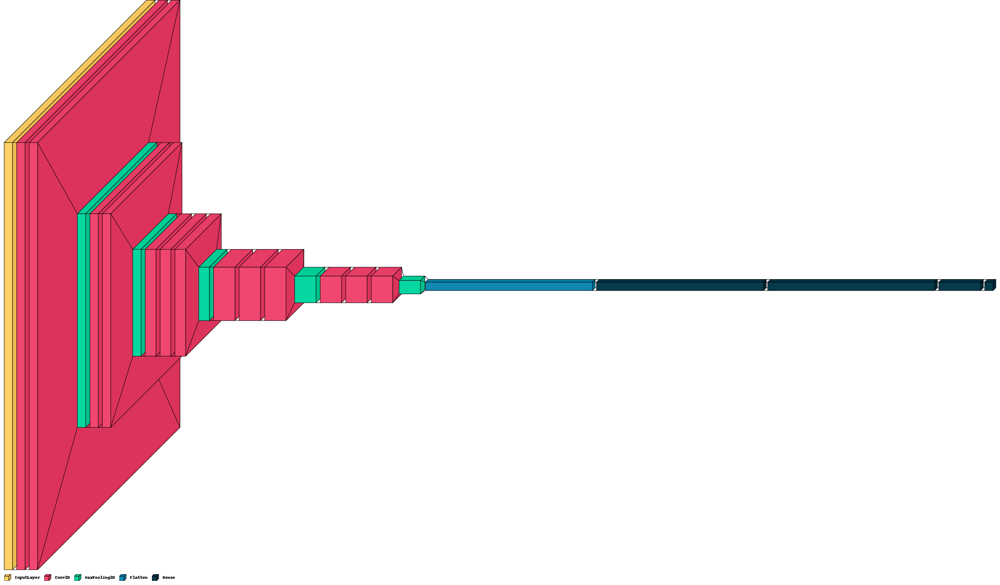

In [21]:
import visualkeras

visualkeras.layered_view(model,legend=True)

In [22]:
callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [23]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/5
125/125 [==============================] - 85s 675ms/step - loss: 16878326.0000 - binary_accuracy: 0.4895 - val_loss: 12.2908 - val_binary_accuracy: 0.5000
Epoch 2/5
125/125 [==============================] - 84s 668ms/step - loss: 7.8386 - binary_accuracy: 0.4890 - val_loss: 7.0743 - val_binary_accuracy: 0.5000
Epoch 3/5
125/125 [==============================] - 84s 669ms/step - loss: 9.5744 - binary_accuracy: 0.4920 - val_loss: 1.4731 - val_binary_accuracy: 0.5000
Epoch 4/5
125/125 [==============================] - 84s 667ms/step - loss: 3.1692 - binary_accuracy: 0.4910 - val_loss: 1.7437 - val_binary_accuracy: 0.5000
Epoch 5/5
125/125 [==============================] - 84s 665ms/step - loss: 1.1541 - binary_accuracy: 0.4910 - val_loss: 0.7119 - val_binary_accuracy: 0.5000


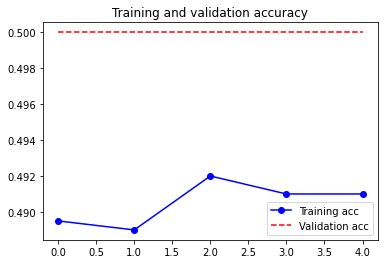

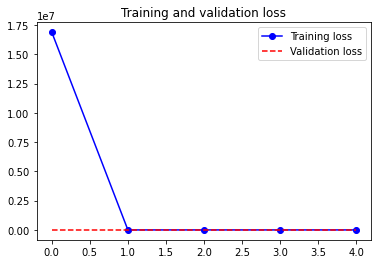

In [24]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo-', label='Training acc')
plt.plot(epochs_range, val_acc, 'r--', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo-', label='Training loss')
plt.plot(epochs_range, val_loss, 'r--', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [25]:
# 문제 1-2. hyperparameter 설정
# [[YOUR CODE]]

batch_size = 8
epochs = 20
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [26]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.7,
                                     width_shift_range=0.6,
                                     height_shift_range=0.6,
                                     zoom_range=0.4,
                                     horizontal_flip=True, 
                                     vertical_flip=False)

In [27]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [28]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [29]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


In [30]:
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)



x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dense(1000, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_13 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 conv2d_14 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 128, 128, 64)     0         
 2D)                                                             
                                                                 
 conv2d_15 (Conv2D)          (None, 128, 128, 128)     7385

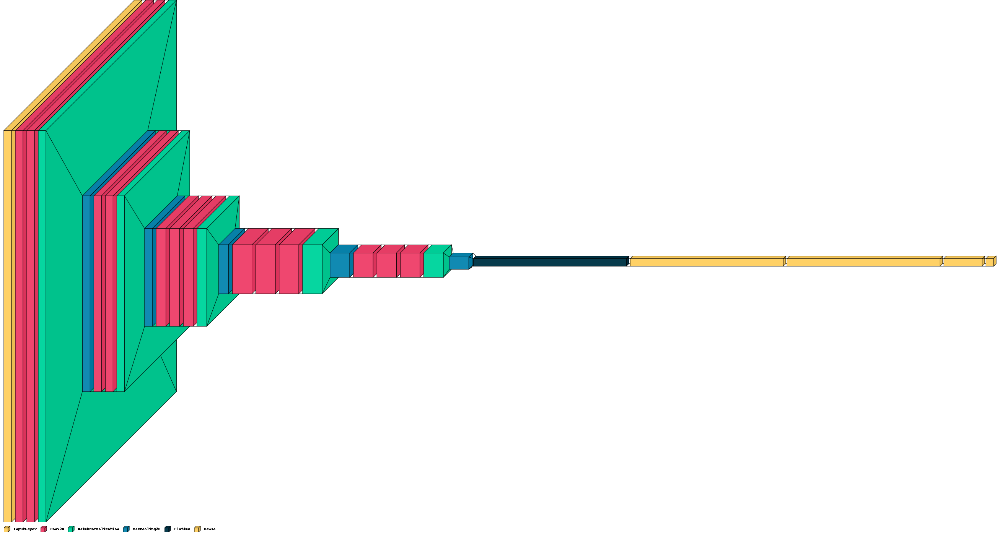

In [31]:
visualkeras.layered_view(model,legend=True)

In [32]:
callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [33]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/20
250/250 [==============================] - 94s 371ms/step - loss: 788.7675 - binary_accuracy: 0.5075 - val_loss: 0.6943 - val_binary_accuracy: 0.5000
Epoch 2/20
250/250 [==============================] - 94s 373ms/step - loss: 0.6957 - binary_accuracy: 0.4995 - val_loss: 0.6936 - val_binary_accuracy: 0.5000
Epoch 3/20
250/250 [==============================] - 93s 370ms/step - loss: 0.7180 - binary_accuracy: 0.4890 - val_loss: 0.7132 - val_binary_accuracy: 0.4990
Epoch 4/20
250/250 [==============================] - 91s 362ms/step - loss: 0.6936 - binary_accuracy: 0.4805 - val_loss: 96.4771 - val_binary_accuracy: 0.5000
Epoch 5/20
250/250 [==============================] - 92s 365ms/step - loss: 0.6940 - binary_accuracy: 0.4865 - val_loss: 91.6481 - val_binary_accuracy: 0.5000
Epoch 6/20
250/250 [==============================] - 93s 371ms/step - loss: 0.6936 - binary_accuracy: 0.5080 - val_loss: 14.8244 - val_binary_accuracy: 0.5020
Epoch 7/20
250/250 [=====================

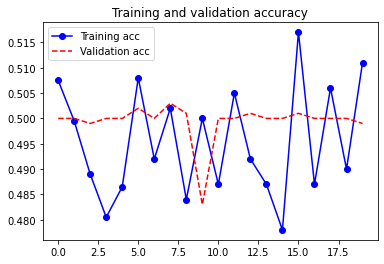

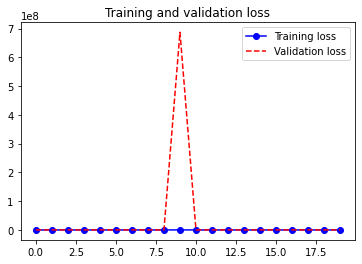

In [34]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo-', label='Training acc')
plt.plot(epochs_range, val_acc, 'r--', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo-', label='Training loss')
plt.plot(epochs_range, val_loss, 'r--', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [35]:
val_loss, val_accuracy = model.evaluate(val_data_gen)
print('Validation accuracy:', val_accuracy)

125/125 [==============================] - 6s 45ms/step - loss: 1431.4774 - binary_accuracy: 0.4990
Validation accuracy: 0.49900001287460327


In [36]:
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dropout(0.5)(x)  # Dropout 추가
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dropout(0.5)(x)  # Dropout 추가
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_26 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 conv2d_27 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_5 (Batc  (None, 256, 256, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 128, 128, 64)      0   

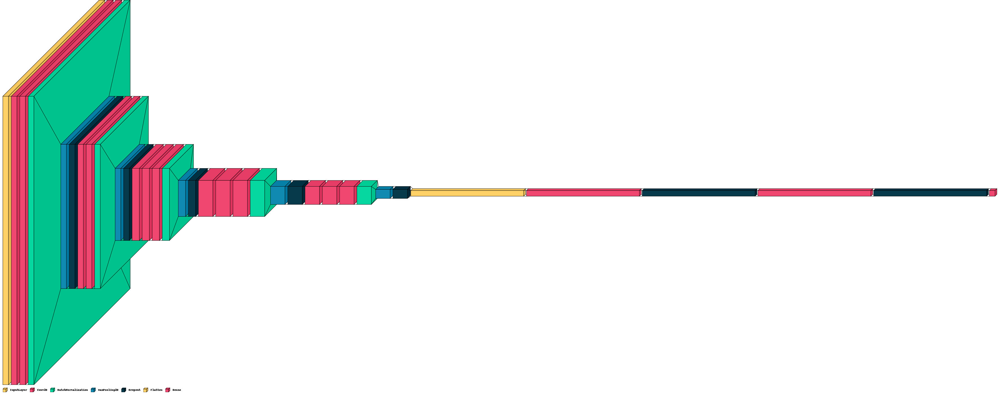

In [37]:
visualkeras.layered_view(model,legend=True)

In [38]:
callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [39]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/20
250/250 [==============================] - 96s 378ms/step - loss: 249.7904 - binary_accuracy: 0.4755 - val_loss: 0.9993 - val_binary_accuracy: 0.5040
Epoch 2/20
250/250 [==============================] - 94s 373ms/step - loss: 1.7326 - binary_accuracy: 0.4870 - val_loss: 0.9707 - val_binary_accuracy: 0.5160
Epoch 3/20
250/250 [==============================] - 94s 372ms/step - loss: 1.2380 - binary_accuracy: 0.4980 - val_loss: 0.8138 - val_binary_accuracy: 0.4840
Epoch 4/20
250/250 [==============================] - 94s 373ms/step - loss: 0.9647 - binary_accuracy: 0.5085 - val_loss: 0.6994 - val_binary_accuracy: 0.5030
Epoch 5/20
250/250 [==============================] - 94s 373ms/step - loss: 0.7510 - binary_accuracy: 0.5070 - val_loss: 0.6978 - val_binary_accuracy: 0.5010
Epoch 6/20
250/250 [==============================] - 94s 374ms/step - loss: 0.9640 - binary_accuracy: 0.4890 - val_loss: 0.7593 - val_binary_accuracy: 0.4990
Epoch 7/20
250/250 [========================

In [40]:
val_loss, val_accuracy = model.evaluate(val_data_gen)
print('Validation accuracy:', val_accuracy)

125/125 [==============================] - 6s 45ms/step - loss: 0.6912 - binary_accuracy: 0.5030
Validation accuracy: 0.503000020980835


In [41]:
# 훈련 데이터셋에 대한 예측값 생성
train_predictions = model.predict(train_data_gen)
# 예측값을 클래스로 변환 (확률값에서 가장 높은 값을 가지는 클래스 선택)
train_pred_labels = np.argmax(train_predictions, axis=1)

# 훈련 데이터의 실제 레이블
train_true_labels = train_data_gen.classes

# 훈련 정확도 계산
train_accuracy = np.mean(train_pred_labels == train_true_labels)

print('Training accuracy:', train_accuracy)


Training accuracy: 0.5


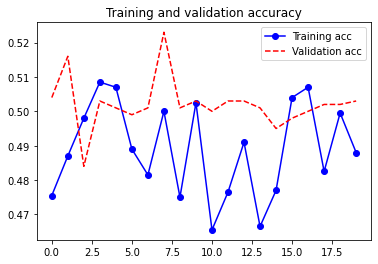

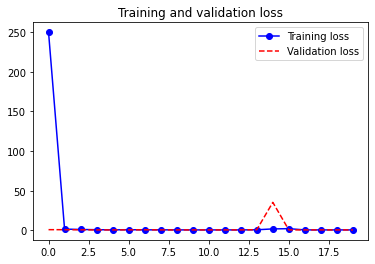

In [42]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo-', label='Training acc')
plt.plot(epochs_range, val_acc, 'r--', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo-', label='Training loss')
plt.plot(epochs_range, val_loss, 'r--', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [43]:
# 문제 1-2. hyperparameter 설정
# [[YOUR CODE]]

batch_size = 4
epochs = 20
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [44]:
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)
x=tf.keras.layers.Dropout(0.25)(x)  # Dropout 추가

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dropout(0.5)(x)  # Dropout 추가
x=tf.keras.layers.Dense(4096, activation='relu')(x)
x=tf.keras.layers.Dropout(0.5)(x)  # Dropout 추가
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()


Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_39 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 conv2d_40 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_10 (Bat  (None, 256, 256, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 dropout_7 (Dropout)         (None, 128, 128, 64)      0   

In [45]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.7,
                                     width_shift_range=0.6,
                                     height_shift_range=0.6,
                                     zoom_range=0.4,
                                     horizontal_flip=True, 
                                     vertical_flip=True)

In [46]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [47]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [48]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


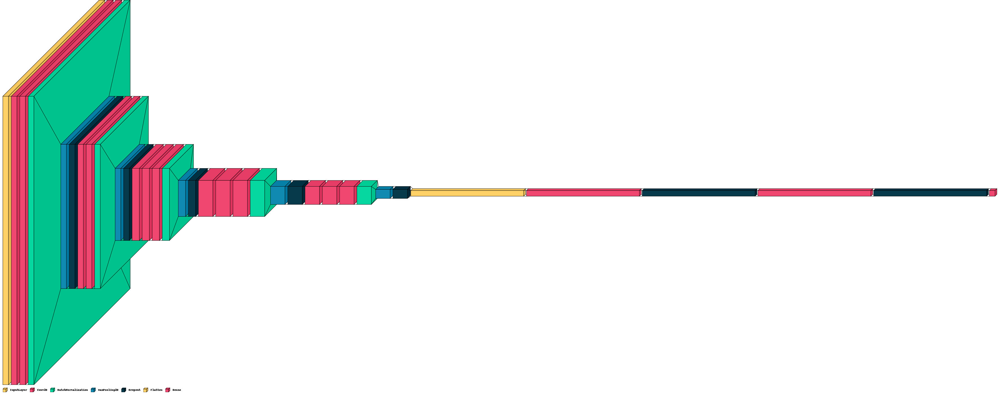

In [49]:
visualkeras.layered_view(model,legend=True)

In [50]:
callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [51]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/20
500/500 [==============================] - 108s 213ms/step - loss: 225.0962 - binary_accuracy: 0.5035 - val_loss: 1.1381 - val_binary_accuracy: 0.5040
Epoch 2/20
500/500 [==============================] - 104s 206ms/step - loss: 0.7234 - binary_accuracy: 0.4850 - val_loss: 1.1583 - val_binary_accuracy: 0.4990
Epoch 3/20
500/500 [==============================] - 105s 209ms/step - loss: 0.7330 - binary_accuracy: 0.4790 - val_loss: 1.2499 - val_binary_accuracy: 0.5030
Epoch 4/20
500/500 [==============================] - 106s 210ms/step - loss: 2.7787 - binary_accuracy: 0.4930 - val_loss: 5.5198 - val_binary_accuracy: 0.5000
Epoch 5/20
500/500 [==============================] - 105s 208ms/step - loss: 50.9554 - binary_accuracy: 0.4875 - val_loss: 0.6932 - val_binary_accuracy: 0.5130
Epoch 6/20
500/500 [==============================] - 108s 215ms/step - loss: 0.6974 - binary_accuracy: 0.5145 - val_loss: 0.6927 - val_binary_accuracy: 0.5010
Epoch 7/20
500/500 [=================

In [52]:
val_loss, val_accuracy = model.evaluate(val_data_gen)
print('Validation accuracy:', val_accuracy)

250/250 [==============================] - 7s 25ms/step - loss: 0.6930 - binary_accuracy: 0.4990
Validation accuracy: 0.49900001287460327


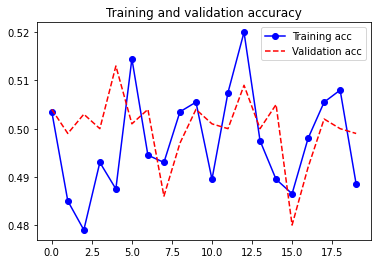

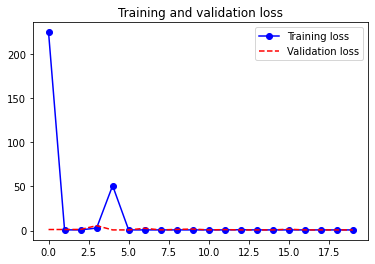

In [53]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo-', label='Training acc')
plt.plot(epochs_range, val_acc, 'r--', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo-', label='Training loss')
plt.plot(epochs_range, val_loss, 'r--', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [54]:
# 문제 1-2. hyperparameter 설정
# [[YOUR CODE]]

batch_size = 4
epochs = 20
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [55]:
input_layer = tf.keras.layers.Input(shape=(256, 256, 3))
x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(input_layer)
x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same', kernel_initializer='he_normal')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, activation='relu', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(4096, activation='relu', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Dropout(0.5)(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_52 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 conv2d_53 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_15 (Bat  (None, 256, 256, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 dropout_14 (Dropout)        (None, 128, 128, 64)      0   

In [56]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.7,
                                     width_shift_range=0.6,
                                     height_shift_range=0.6,
                                     zoom_range=0.4,
                                     horizontal_flip=True, 
                                     vertical_flip=True)

In [57]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [58]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [59]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


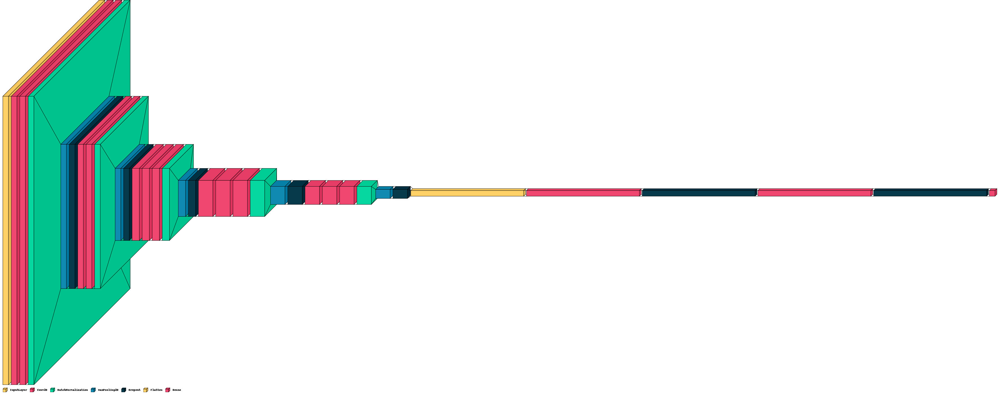

In [60]:
visualkeras.layered_view(model,legend=True)

In [61]:
callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [62]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/20
500/500 [==============================] - 109s 214ms/step - loss: 346.5206 - binary_accuracy: 0.5050 - val_loss: 1.2372 - val_binary_accuracy: 0.5280
Epoch 2/20
500/500 [==============================] - 107s 213ms/step - loss: 0.7584 - binary_accuracy: 0.4960 - val_loss: 0.7906 - val_binary_accuracy: 0.5090
Epoch 3/20
500/500 [==============================] - 107s 214ms/step - loss: 0.7025 - binary_accuracy: 0.4760 - val_loss: 0.8241 - val_binary_accuracy: 0.5130
Epoch 4/20
500/500 [==============================] - 107s 212ms/step - loss: 0.6943 - binary_accuracy: 0.4870 - val_loss: 0.8352 - val_binary_accuracy: 0.5030
Epoch 5/20
500/500 [==============================] - 107s 213ms/step - loss: 0.7090 - binary_accuracy: 0.5080 - val_loss: 21.2739 - val_binary_accuracy: 0.5200
Epoch 6/20
500/500 [==============================] - 107s 213ms/step - loss: 1.9973 - binary_accuracy: 0.4715 - val_loss: 2.1672 - val_binary_accuracy: 0.4990
Epoch 7/20
500/500 [=================

In [63]:
val_loss, val_accuracy = model.evaluate(val_data_gen)
print('Validation accuracy:', val_accuracy)

250/250 [==============================] - 7s 26ms/step - loss: 1.7431 - binary_accuracy: 0.5000
Validation accuracy: 0.5


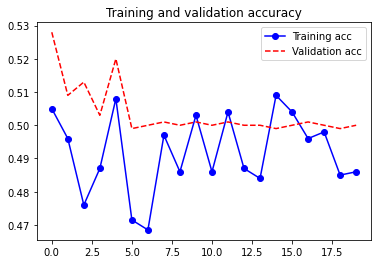

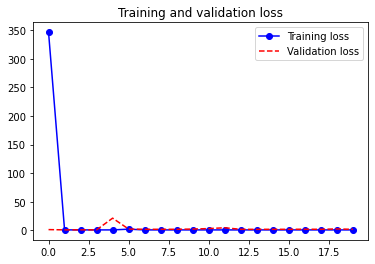

In [64]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo-', label='Training acc')
plt.plot(epochs_range, val_acc, 'r--', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo-', label='Training loss')
plt.plot(epochs_range, val_loss, 'r--', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# Faster RCNN

## Object Detection

In [65]:
# !pip3 install tensorflow-estimator==2.6.0

     |████████████████████████████████| 462 kB 13.0 MB/s eta 0:00:01


In [67]:
# !pip install tensorflow-hub

     |████████████████████████████████| 404 kB 20.0 MB/s eta 0:00:01
     |████████████████████████████████| 1.7 MB 70.1 MB/s eta 0:00:01
     |████████████████████████████████| 1.7 MB 44.2 MB/s eta 0:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.19.4
    Uninstalling protobuf-3.19.4:
      Successfully uninstalled protobuf-3.19.4


In [68]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [69]:
def display_image(image):
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)

In [70]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)  # 이미지 읽기
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
    pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
    pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
    print("Image downloaded to %s." % filename)
    if display:
        display_image(pil_image)
    return filename

In [71]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

    # BBox 테두리 그리기
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]

    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height

    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),
                  display_str,
                  fill="black",
                  font=font)
        text_bottom -= text_height - 2 * margin

In [72]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    # BBox 그리기 적용
    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                           int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
        draw_bounding_box_on_image(
            image_pil,
            ymin,
            xmin,
            ymax,
            xmax,
            color,
            font,
            display_str_list=[display_str])
        np.copyto(image, np.array(image_pil))
    return image

Image downloaded to /var/folders/g1/9q6hh8h945d63y9rn5k1l5yc0000gn/T/tmph5e5dgwa.jpg.


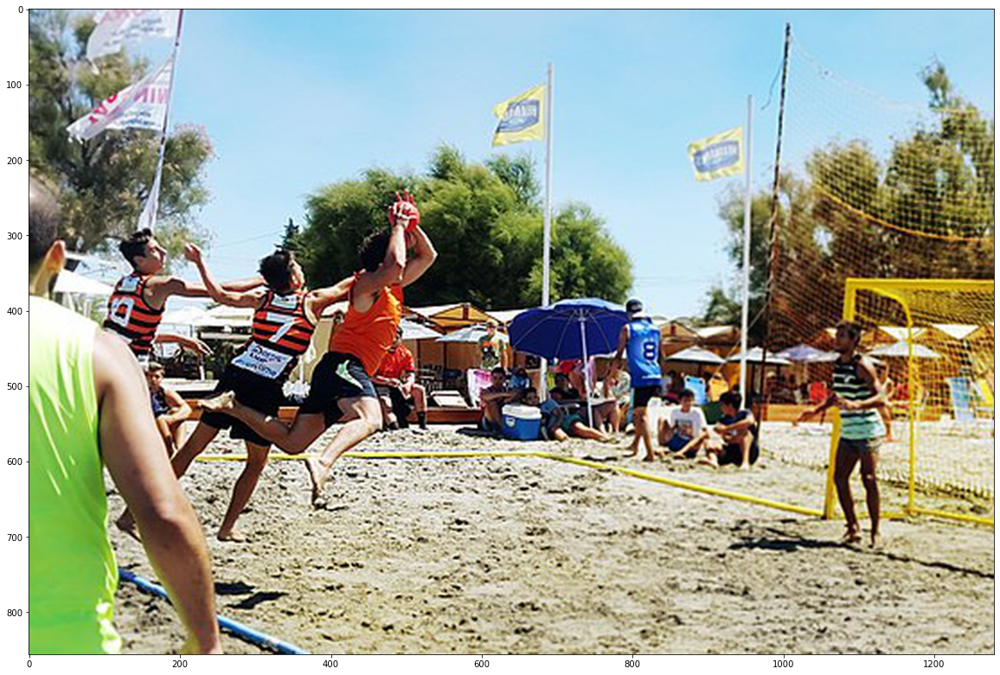

In [73]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [74]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

res_detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [75]:
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

In [76]:
def run_detector(detector, path):
    img = load_img(path) 

    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
    image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

    display_image(image_with_boxes)

Found 100 objects.
Inference time:  343.62357878685
Font not found, using default font.


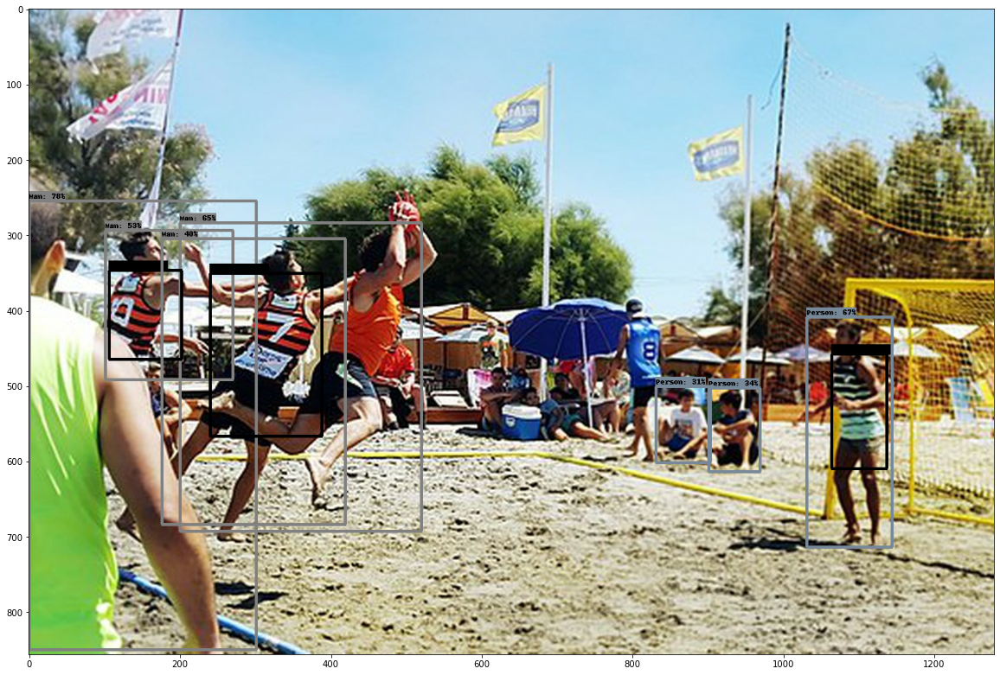

In [77]:
run_detector(res_detector, downloaded_image_path)

### 다른 이미지 테스트해보기

Image downloaded to /var/folders/g1/9q6hh8h945d63y9rn5k1l5yc0000gn/T/tmp3ff1yzy5.jpg.


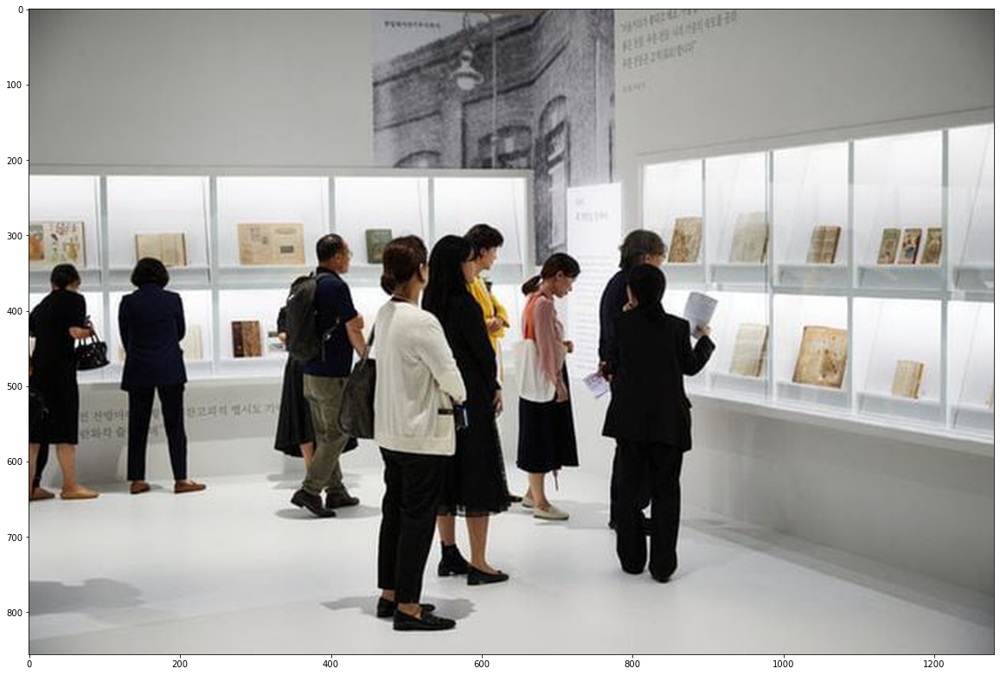

In [78]:
image_url = "https://images.chosun.com/resizer/uPpc_EKVYI5CPYOIb4p__lcAcM0=/616x0/smart/cloudfront-ap-northeast-1.images.arcpublishing.com/chosun/FWXC7I3PZKTMX4SQKAYCCZXKPE.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  33.24127197265625
Font not found, using default font.


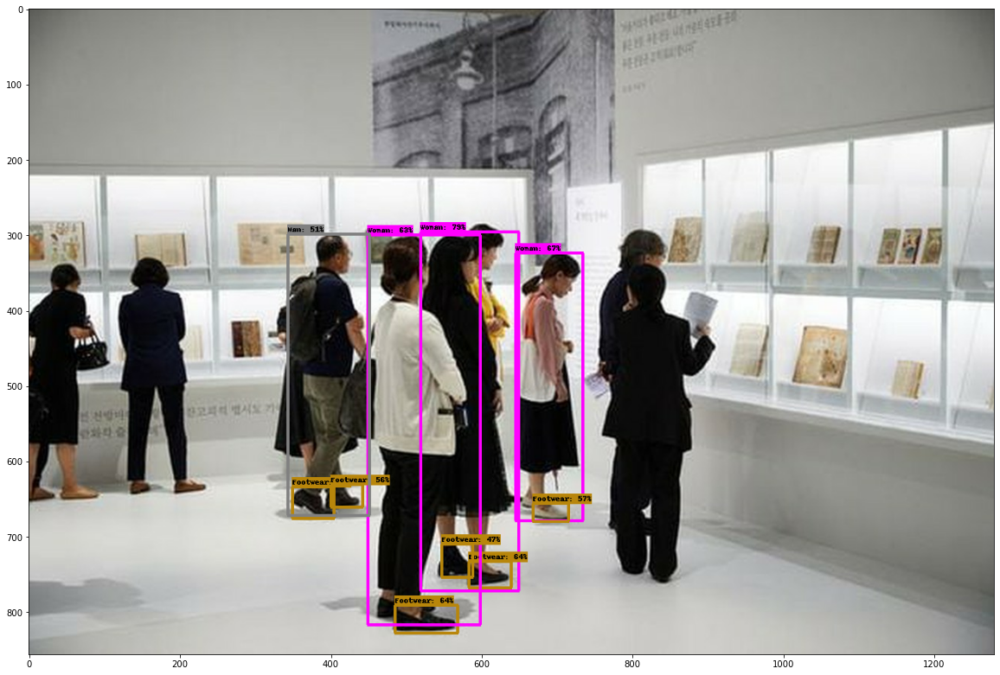

In [79]:
run_detector(res_detector, downloaded_image_path)

In [80]:
# mobilenet

module_handle = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow1/variations/openimages-v4-ssd-mobilenet-v2/versions/1"  

mobile_detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Found 100 objects.
Inference time:  61.334737062454224
Font not found, using default font.


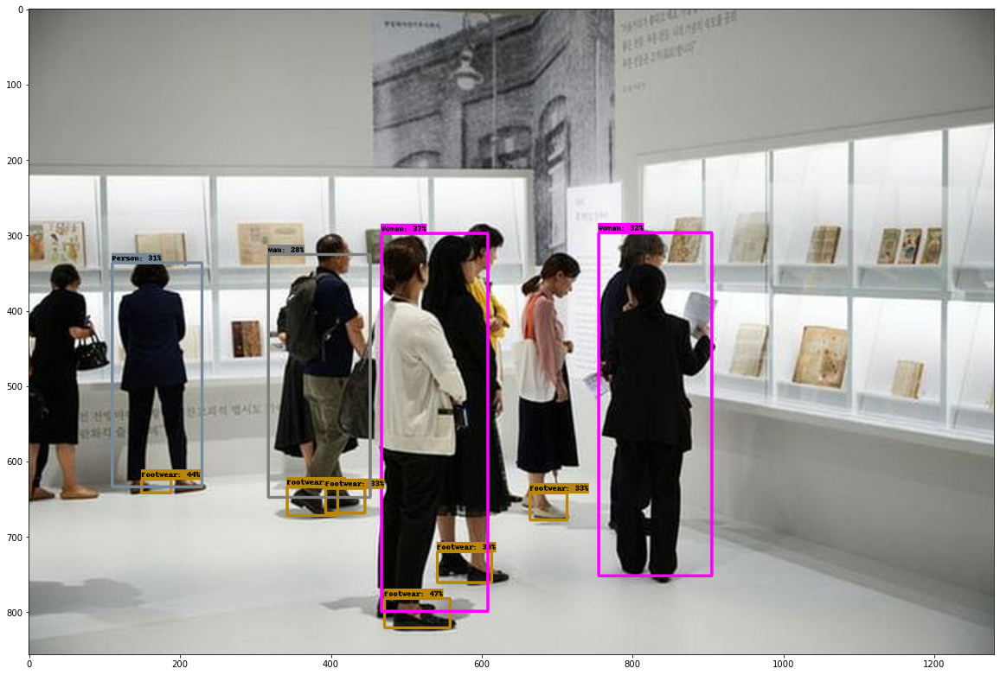

In [81]:
run_detector(mobile_detector, downloaded_image_path)

Image downloaded to /var/folders/g1/9q6hh8h945d63y9rn5k1l5yc0000gn/T/tmp24u854lp.jpg.


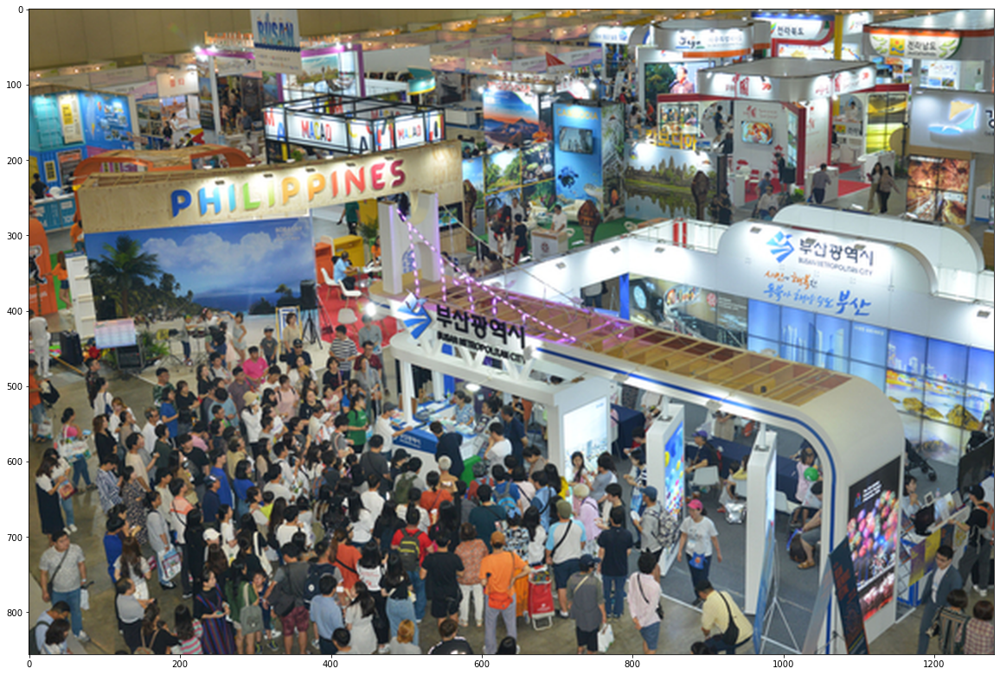

In [82]:
image_url = "https://pds.joongang.co.kr/news/component/joongang_sunday/202109/09/2eca887e-e926-4747-b940-e3200bc8f945.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  41.10841083526611
Font not found, using default font.


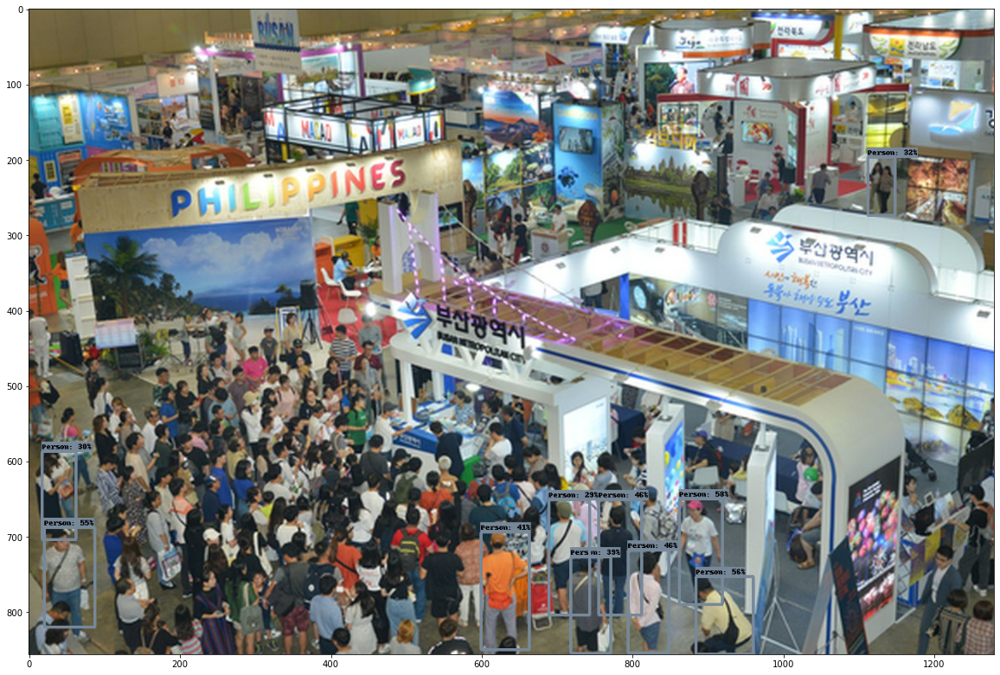

In [83]:
run_detector(res_detector, downloaded_image_path)

Found 100 objects.
Inference time:  5.986783981323242
Font not found, using default font.


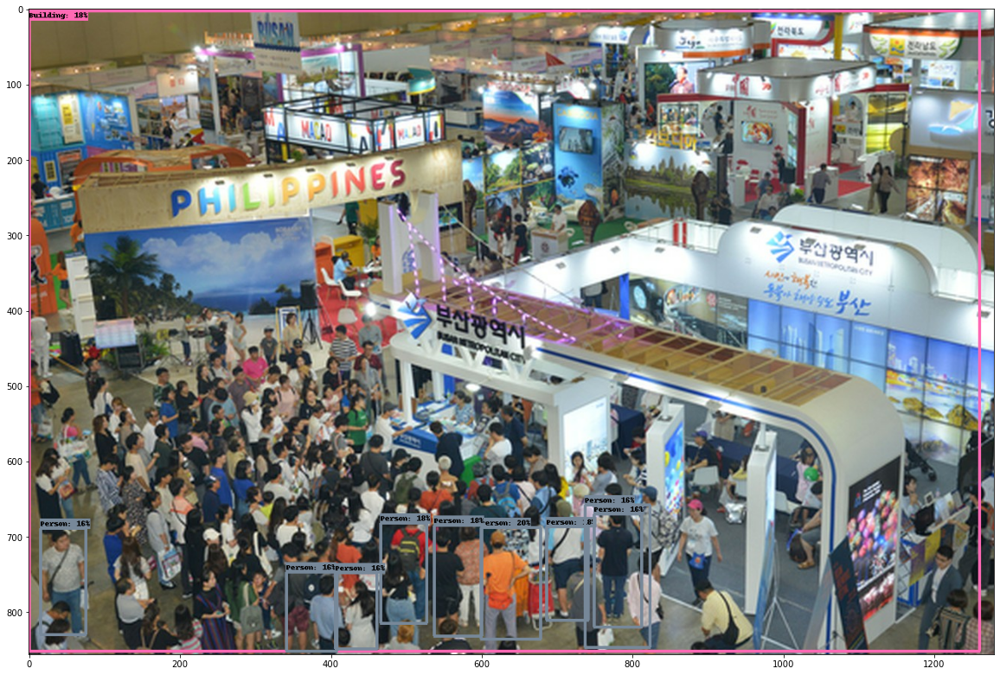

In [84]:
run_detector(mobile_detector, downloaded_image_path)

### 회고

binary_accuracy: 0.5390<br>
Validation accuracy: 0.5389999747276306<br>
까지 달성은 했다.

layer 나 Dense 수정을 하는게 어려웠습니다.
성능을 높이기 위해 드랍아웃이나 BatchNormalization의 중요성을 알 수 있었습니다.<br>
이론적으로 좀 더 공부가 더 필요하다는게 느껴졌습니다.

pre-trained 모델로 detector 를 해보면서 모델들의 성능<br>
차이를 확인할 수 있었어 좋았다.

